In [37]:
import pandas as pd 
import seaborn as sns 
import numpy as np 
import matplotlib.pyplot as plt

from tqdm import tqdm
import warnings
tqdm.pandas()
# import nltk 
# nltk.download('punkt')
from tqdm.notebook import tqdm_notebook as tqdm

sns.set()
pd.options.display.max_columns = None 
pd.options.display.max_rows = 100 



In [38]:
from pandas_profiling import ProfileReport


In [39]:
df1 = pd.read_csv("data_1.csv",index_col="codering")
df2 = pd.read_csv("data_2.csv",index_col="codering")
df3 = pd.read_csv("data_3.csv",index_col="codering")

In [40]:
df = pd.concat([df1,df2,df3],axis=1,copy=False)

num_cols = df.dtypes[df.dtypes == "float64"].keys().to_list()

cat_cols = df.dtypes[df.dtypes == "object"].keys().to_list()


#drop duplicte columns
df = df.T.drop_duplicates().T

df[num_cols] = df[num_cols].astype("float64")

In [41]:
df  = df.drop("id_old",axis=1)

In [42]:

df_buurt = df[df.soort_regio== "Buurt"]

df_wijk = df[df.soort_regio== "Wijk"]

df_gemeente = df[df.soort_regio== "Gemeente"]

In [43]:
profile = ProfileReport(df_buurt[num_cols+["gemeentenaam"]],minimal=True)

In [44]:
profile

Summarize dataset:   0%|          | 0/82 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Cleaning

In [240]:
dff_buurt = df_buurt.copy()

In [241]:
dff_buurt.shape

(13290, 77)

In [242]:
dff_buurt.columns[dff_buurt.isna().sum() == 0]

Index(['Unnamed: 0', 'gemeentenaam', 'soort_regio', 'id', 'aantal_inwoners',
       'woningkenmerken', 'stadsverwarming', 'mannen', 'vrouwen',
       'k_0_tot_15_jaar', 'k_15_tot_25_jaar', 'k_25_tot_45_jaar',
       'k_45_tot_65_jaar', 'k_65_jaar_of_ouder', 'huishoudens_totaal',
       'eenpersoonshuishoudens', 'huishoudens_zonder_kinderen',
       'huishoudens_met_kinderen', 'woningvoorraad',
       'aantal_inkomensontvangers', 'personenautos_brandstof_benzine',
       'personenautos_overige_brandstof', 'oppervlakte_land',
       'indelingswijziging_wijken_en_buurten',
       'werkloosheidsuitkering_relatief', 'bijstandsuitkering_relatief',
       'arbeidsongeschiktheidsuitkering_relatief', 'aow_uitkering_relatief',
       'inwoners_vanaf_15_jaar', 'inwoners_vanaf_15_jr_tot_aow_leeftijd',
       'inwoners_vanaf_de_aow_leeftijd'],
      dtype='object')

In [243]:

#columns with no NaNs and probably only zeros
dff_buurt_cols_w_zeros = list(dff_buurt.columns[dff_buurt.isna().sum() == 0].drop(["stadsverwarming"]))
print(dff_buurt_cols_w_zeros)
dff_buurt.loc[:,dff_buurt_cols_w_zeros] = dff_buurt.loc[:,dff_buurt_cols_w_zeros].replace(0,np.nan)


['Unnamed: 0', 'gemeentenaam', 'soort_regio', 'id', 'aantal_inwoners', 'woningkenmerken', 'mannen', 'vrouwen', 'k_0_tot_15_jaar', 'k_15_tot_25_jaar', 'k_25_tot_45_jaar', 'k_45_tot_65_jaar', 'k_65_jaar_of_ouder', 'huishoudens_totaal', 'eenpersoonshuishoudens', 'huishoudens_zonder_kinderen', 'huishoudens_met_kinderen', 'woningvoorraad', 'aantal_inkomensontvangers', 'personenautos_brandstof_benzine', 'personenautos_overige_brandstof', 'oppervlakte_land', 'indelingswijziging_wijken_en_buurten', 'werkloosheidsuitkering_relatief', 'bijstandsuitkering_relatief', 'arbeidsongeschiktheidsuitkering_relatief', 'aow_uitkering_relatief', 'inwoners_vanaf_15_jaar', 'inwoners_vanaf_15_jr_tot_aow_leeftijd', 'inwoners_vanaf_de_aow_leeftijd']


In [244]:
dff_buurt["stadsverwarming"]  = dff_buurt["stadsverwarming"] / 10

In [245]:
dff_buurt["stadsverwarming"].mean()

2.6393227990970662

In [246]:
#Rescale huishoudgrootte  

dff_buurt.loc[:,"gemiddelde_huishoudensgrootte"] =dff_buurt.loc[:,"gemiddelde_huishoudensgrootte"]/10
dff_buurt["gemiddelde_huishoudensgrootte"] 

codering
BU08093091    2.6
BU05050202    2.3
BU05890208    3.0
BU09173201    1.3
BU01480103    2.1
             ... 
BU17011002    2.3
BU00480104    2.1
BU17080509    3.6
BU19480210    2.3
BU16811209    2.3
Name: gemiddelde_huishoudensgrootte, Length: 13290, dtype: float64

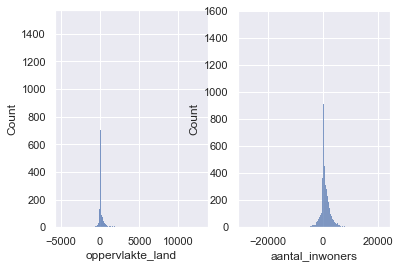

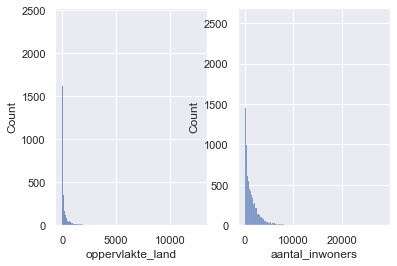

In [247]:

plt.subplot(1,2,1)

sns.histplot(dff_buurt['oppervlakte_land'])



plt.subplot(1,2,2)

sns.histplot(dff_buurt['aantal_inwoners'])

plt.show()



dff_buurt.loc[:,"aantal_inwoners_art"] = dff_buurt.vrouwen + dff_buurt.mannen
dff_buurt.loc[:,"aantal_inwoners"] = dff_buurt.loc[:,"aantal_inwoners"].apply(np.abs)

np.corrcoef(dff_buurt[["aantal_inwoners_art","aantal_inwoners"]].dropna()["aantal_inwoners_art"],dff_buurt[["aantal_inwoners_art","aantal_inwoners"]].dropna()["aantal_inwoners"])


dff_buurt.loc[:,"oppervlakte_land"] = dff_buurt.loc[:,"oppervlakte_land"].apply(np.abs)


plt.subplot(1,2,1)
sns.histplot(dff_buurt['oppervlakte_land'])


plt.subplot(1,2,2)
sns.histplot(dff_buurt['aantal_inwoners'])

plt.show()




<AxesSubplot:xlabel='huishoudens_totaal', ylabel='Count'>

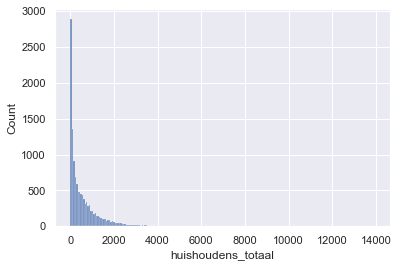

In [248]:
sns.histplot(dff_buurt['huishoudens_totaal'])

<AxesSubplot:xlabel='percentage_woningen_met_stadsverwarming', ylabel='Count'>

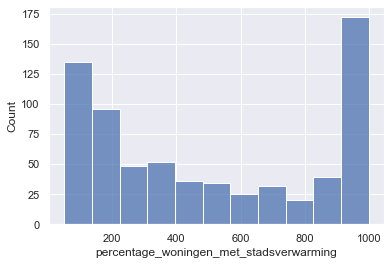

In [249]:
sns.histplot(dff_buurt["percentage_woningen_met_stadsverwarming"])

In [250]:
dff_buurt["percentage_woningen_met_stadsverwarming"] = dff_buurt["percentage_woningen_met_stadsverwarming"]/10 #*100
dff_buurt["percentage_woningen_met_stadsverwarming"].mean() 

50.90943396226417

In [251]:



# dff_buurt['personenautos_overige_brandstof']  = dff_buurt.apply(lambda x: x['personenautos_overige_brandstof'] if x['personenautos_overige_brandstof'] < x['aantal_inwoners'] else np.nan, axis=1)


# "in_bezit_woningcorporatie","in_bezit_overige_verhuurders","eigendom_onbekend","bouwjaar_voor_2000","bouwjaar_vanaf_2000"

# "aantal_inkomensontvangers",


9000.0 18190.0


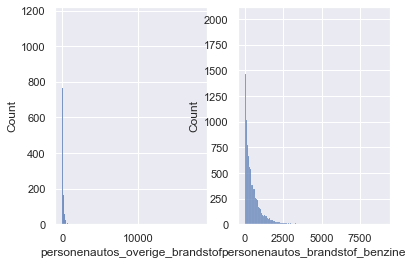

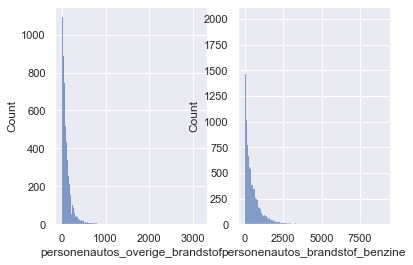

(9000.0, 3175.0)

In [252]:
print(dff_buurt['personenautos_brandstof_benzine'].max(),dff_buurt['personenautos_overige_brandstof'].max())

plt.subplot(1,2,1)

sns.histplot(dff_buurt['personenautos_overige_brandstof'])


plt.subplot(1,2,2)

sns.histplot(dff_buurt['personenautos_brandstof_benzine'])



plt.show()

dff_buurt['personenautos_brandstof_benzine'] = dff_buurt['personenautos_brandstof_benzine'].apply(np.abs)

dff_buurt['personenautos_overige_brandstof']  = dff_buurt.apply(lambda x: x['personenautos_overige_brandstof'] if x['personenautos_overige_brandstof'] < x['aantal_inwoners'] else np.nan, axis=1)

plt.subplot(1,2,1)

sns.histplot(dff_buurt['personenautos_overige_brandstof'])

plt.subplot(1,2,2)

sns.histplot(dff_buurt['personenautos_brandstof_benzine'])

plt.show()

dff_buurt['personenautos_brandstof_benzine'].max(),dff_buurt['personenautos_overige_brandstof'].max()

In [253]:
dff_buurt['aantal_installaties_bij_woningen']  = dff_buurt.apply(lambda x: x['aantal_installaties_bij_woningen'] if x['aantal_installaties_bij_woningen'] < x['aantal_inwoners'] else np.nan, axis=1)

In [254]:
dff_buurt['totaal_aantal_laadpalen'].value_counts(bins=100)[:20]

(-0.386, 3.85]     11077
(3.85, 7.7]          460
(7.7, 11.55]          67
(11.55, 15.4]         24
(15.4, 19.25]         10
(19.25, 23.1]          3
(26.95, 30.8]          3
(23.1, 26.95]          2
(42.35, 46.2]          1
(69.3, 73.15]          1
(381.15, 385.0]        1
(38.5, 42.35]          0
(215.6, 219.45]        0
(292.6, 296.45]        0
(288.75, 292.6]        0
(284.9, 288.75]        0
(281.05, 284.9]        0
(277.2, 281.05]        0
(273.35, 277.2]        0
(269.5, 273.35]        0
Name: totaal_aantal_laadpalen, dtype: int64

<AxesSubplot:xlabel='totaal_aantal_laadpalen', ylabel='Count'>

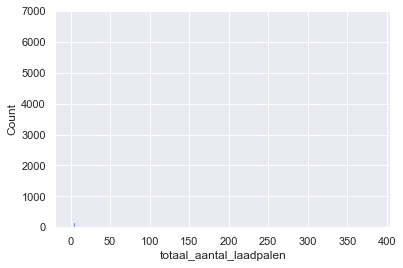

In [255]:
sns.histplot(dff_buurt['totaal_aantal_laadpalen'])

In [256]:
dff_buurt['totaal_aantal_laadpalen'][dff_buurt['totaal_aantal_laadpalen'] >30] = np.nan

<ipython-input-256-4cd860708d1f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff_buurt['totaal_aantal_laadpalen'][dff_buurt['totaal_aantal_laadpalen'] >30] = np.nan


<AxesSubplot:xlabel='totaal_aantal_laadpalen', ylabel='Count'>

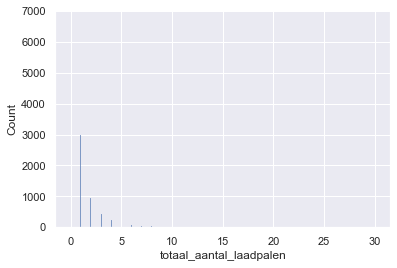

In [257]:
sns.histplot(dff_buurt['totaal_aantal_laadpalen'])

### Verwijder buurten met minder dan 0 inwoners en huihouderes

(13290, 78)
(13290, 78)


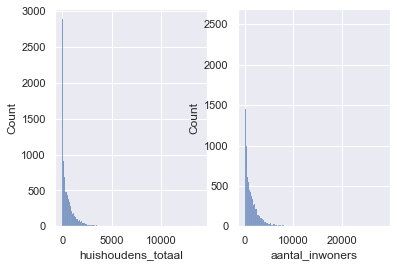

In [258]:
plt.subplot(1,2,1)

sns.histplot(dff_buurt['huishoudens_totaal'])

print(dff_buurt.shape)

plt.subplot(1,2,2)

sns.histplot(dff_buurt['aantal_inwoners'])

print(dff_buurt.shape)

In [259]:
dff_buurt = dff_buurt[dff_buurt['aantal_inwoners']>0]
print(dff_buurt.shape)
dff_buurt = dff_buurt[dff_buurt['huishoudens_totaal']>0]

print(dff_buurt.shape)

(12989, 78)
(12688, 78)


<AxesSubplot:xlabel='aantal_inwoners', ylabel='Count'>

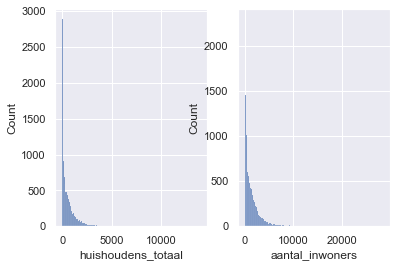

In [260]:
plt.subplot(1,2,1)

sns.histplot(dff_buurt['huishoudens_totaal'])


plt.subplot(1,2,2)

sns.histplot(dff_buurt['aantal_inwoners'])

#### Verwijder duplicates

In [261]:
dff_buurt

,Unnamed: 0,gemeentenaam,soort_regio,id,aantal_inwoners,woningkenmerken,stadsverwarming,mannen,vrouwen,k_0_tot_15_jaar,k_15_tot_25_jaar,k_25_tot_45_jaar,k_45_tot_65_jaar,k_65_jaar_of_ouder,huishoudens_totaal,eenpersoonshuishoudens,huishoudens_zonder_kinderen,huishoudens_met_kinderen,gemiddelde_huishoudensgrootte,bevolkingsdichtheid,woningvoorraad,gemiddelde_woningwaarde,koopwoningen,huurwoningen_totaal,in_bezit_woningcorporatie,in_bezit_overige_verhuurders,eigendom_onbekend,bouwjaar_voor_2000,bouwjaar_vanaf_2000,gemiddeld_elektriciteitsverbruik_totaal,elect_appartement,elect_tussenwoning,elect_hoekwoning,elect_twee_onder_een_kap_woning,elect_vrijstaande_woning,elect_huurwoning,elect_eigen_woning,gemiddeld_aardgasverbruik_totaal,aard_appartement,aard_tussenwoning,aard_hoekwoning,aard_twee_onder_een_kap_woning,aard_vrijstaande_woning,aard_huurwoning,aard_eigen_woning,percentage_woningen_met_stadsverwarming,aantal_inkomensontvangers,gemiddeld_inkomen_per_inkomensontvanger,gemiddeld_inkomen_per_inwoner,k_40_huishoudens_met_laagste_inkomen,k_20_huishoudens_met_hoogste_inkomen,personen_per_soort_uitkering_bijstand,personenautos_brandstof_benzine,personenautos_overige_brandstof,oppervlakte_land,mate_van_stedelijkheid,omgevingsadressendichtheid,bedrijfsvestigingen_totaal,type_a_landbouw_bosbouw_visserij,type_bf_nijverheid_energie,type_gi_handel_horeca,type_hj_vervoer_informatie_communicatie,type_kl_financiele_diensten_onroerendgoed,type_mn_zakelijke_dienstverlening,type_ru_cultuur_recreatie_overige_diensten,indelingswijziging_wijken_en_buurten,aantal_installaties_bij_woningen,aantal_zonnepanelen_per_installatie,opgesteld_vermogen_van_zonnepanelen,totaal_aantal_laadpalen,werkloosheidsuitkering_relatief,bijstandsuitkering_relatief,arbeidsongeschiktheidsuitkering_relatief,aow_uitkering_relatief,inwoners_vanaf_15_jaar,inwoners_vanaf_15_jr_tot_aow_leeftijd,inwoners_vanaf_de_aow_leeftijd,aantal_inwoners_art
codering,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BU08093091,9503,LoonopZand,Buurt,96,222.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,110.0,110.0,35.0,30.0,40.0,70.0,45.0,80.0,15.0,35.0,35.0,2.6,26.0,92.0,425.0,90.0,8.0,0.0,8.0,2.0,74.0,26.0,4680.0,NaN,1900.0,NaN,4000.0,5420.0,NaN,4550.0,2350.0,NaN,910.0,NaN,1630.0,2860.0,NaN,2190.0,NaN,200.0,NaN,NaN,NaN,NaN,0.0,90.0,35.0,856.0,5.0,235.0,35.0,10.0,5.0,10.0,0.0,5.0,5.0,0.0,1.0,10.0,26.0,60.0,0.0,90.0,20.0,155.0,930.0,800.0,630.0,200.0,220.0
BU05050202,4063,Dordrecht,Buurt,67,1046.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,535.0,505.0,200.0,155.0,285.0,290.0,115.0,450.0,175.0,95.0,190.0,2.3,5979.0,437.0,131.0,24.0,76.0,71.0,5.0,0.0,91.0,9.0,2470.0,2050.0,3080.0,2940.0,NaN,NaN,2220.0,3280.0,840.0,720.0,970.0,980.0,NaN,NaN,790.0,980.0,NaN,800.0,NaN,NaN,607.0,76.0,110.0,235.0,70.0,17.0,1.0,2972.0,50.0,0.0,5.0,10.0,10.0,5.0,5.0,15.0,1.0,NaN,NaN,NaN,0.0,90.0,485.0,455.0,520.0,3380.0,2950.0,440.0,1040.0
BU05890208,11554,Oudewater,Buurt,42,134.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,70.0,60.0,25.0,20.0,25.0,50.0,10.0,45.0,10.0,15.0,25.0,3.0,436.0,49.0,NaN,84.0,14.0,0.0,14.0,2.0,61.0,39.0,5120.0,NaN,NaN,NaN,5030.0,5450.0,NaN,4830.0,2210.0,NaN,NaN,NaN,2270.0,2410.0,NaN,2050.0,NaN,100.0,NaN,NaN,NaN,NaN,0.0,90.0,85.0,31.0,4.0,535.0,120.0,0.0,40.0,45.0,10.0,20.0,5.0,0.0,1.0,6.0,11.0,14.0,1.0,10.0,NaN,40.0,375.0,440.0,400.0,40.0,130.0
BU09173201,6943,Heerlen,Buurt,16,340.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,150.0,185.0,20.0,25.0,55.0,90.0,140.0,255.0,195.0,35.0,25.0,1.3,1542.0,271.0,81.0,11.0,66.0,30.0,37.0,23.0,100.0,0.0,2040.0,1840.0,2490.0,2210.0,NaN,NaN,2120.0,1940.0,930.0,850.0,1050.0,1600.0,NaN,NaN,960.0,930.0,NaN,300.0,NaN,NaN,879.0,0.0,30.0,90.0,5.0,22.0,2.0,1763.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,0.0,55.0,445.0,445.0,1690.0,1280.0,740.0,540.0,335.0
BU01480103,3460,Dalfsen,Buurt,30,1362.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,645.0,715.0,205.0,120.0,300.0,295.0,435.0,6

In [262]:
print(dff_buurt[dff_buurt.duplicated()].shape)

dff_buurt = dff_buurt.drop_duplicates()



duplicates = dff_buurt.index.value_counts().loc[lambda x: x>1].index
dff_buurt.index.value_counts().loc[lambda x: x>1]

print(duplicates)

dff_buurt_ = dff_buurt[dff_buurt.index.isin(duplicates)].reset_index()
dff_buurt_.sort_values(by="codering").head(2)
# num_cols = dff_buurt.dtypes[dff_buurt.dtypes == "float64"].keys().to_list()

# cat_cols = dff_buurt.dtypes[dff_buurt.dtypes == "object"].keys().to_list()



(47, 78)
Index(['BU19480425', 'BU19001008', 'BU08553807', 'BU17420209', 'BU19040702',
       'BU17400106', 'BU01060703', 'BU03639602', 'BU08555701', 'BU18960109',
       'BU02680970', 'BU05120600', 'BU00340306', 'BU04020401', 'BU01190200',
       'BU03073000', 'BU03440831', 'BU03920702', 'BU03420604', 'BU08730101',
       'BU03510001', 'BU03840219', 'BU00340401', 'BU02960124', 'BU09510003',
       'BU19420508', 'BU07960601', 'BU16510009', 'BU17090000', 'BU19403101',
       'BU19302501', 'BU07070100', 'BU03071301'],
      dtype='object')


,codering,Unnamed: 0,gemeentenaam,soort_regio,id,aantal_inwoners,woningkenmerken,stadsverwarming,mannen,vrouwen,k_0_tot_15_jaar,k_15_tot_25_jaar,k_25_tot_45_jaar,k_45_tot_65_jaar,k_65_jaar_of_ouder,huishoudens_totaal,eenpersoonshuishoudens,huishoudens_zonder_kinderen,huishoudens_met_kinderen,gemiddelde_huishoudensgrootte,bevolkingsdichtheid,woningvoorraad,gemiddelde_woningwaarde,koopwoningen,huurwoningen_totaal,in_bezit_woningcorporatie,in_bezit_overige_verhuurders,eigendom_onbekend,bouwjaar_voor_2000,bouwjaar_vanaf_2000,gemiddeld_elektriciteitsverbruik_totaal,elect_appartement,elect_tussenwoning,elect_hoekwoning,elect_twee_onder_een_kap_woning,elect_vrijstaande_woning,elect_huurwoning,elect_eigen_woning,gemiddeld_aardgasverbruik_totaal,aard_appartement,aard_tussenwoning,aard_hoekwoning,aard_twee_onder_een_kap_woning,aard_vrijstaande_woning,aard_huurwoning,aard_eigen_woning,percentage_woningen_met_stadsverwarming,aantal_inkomensontvangers,gemiddeld_inkomen_per_inkomensontvanger,gemiddeld_inkomen_per_inwoner,k_40_huishoudens_met_laagste_inkomen,k_20_huishoudens_met_hoogste_inkomen,personen_per_soort_uitkering_bijstand,personenautos_brandstof_benzine,personenautos_overige_brandstof,oppervlakte_land,mate_van_stedelijkheid,omgevingsadressendichtheid,bedrijfsvestigingen_totaal,type_a_landbouw_bosbouw_visserij,type_bf_nijverheid_energie,type_gi_handel_horeca,type_hj_vervoer_informatie_communicatie,type_kl_financiele_diensten_onroerendgoed,type_mn_zakelijke_dienstverlening,type_ru_cultuur_recreatie_overige_diensten,indelingswijziging_wijken_en_buurten,aantal_installaties_bij_woningen,aantal_zonnepanelen_per_installatie,opgesteld_vermogen_van_zonnepanelen,totaal_aantal_laadpalen,werkloosheidsuitkering_relatief,bijstandsuitkering_relatief,arbeidsongeschiktheidsuitkering_relatief,aow_uitkering_relatief,inwoners_vanaf_15_jaar,inwoners_vanaf_15_jr_tot_aow_leeftijd,inwoners_vanaf_de_aow_leeftijd,aantal_inwoners_art
47,BU00340306,447,Almere,Buurt,30,4142.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,2065.0,2075.0,735.0,640.0,940.0,1430.0,390.0,1680.0,440.0,445.0,795.0,2.5,5695.0,1622.0,178.0,67.0,33.0,28.0,5.0,0.0,95.0,5.0,3110.0,2090.0,3320.0,3410.0,4130.0,3540.0,2460.0,3440.0,1150.0,750.0,1140.0,1340.0,1850.0,1790.0,880.0,1280.0,NaN,3200.0,316.0,246.0,323.0,250.0,140.0,1350.0,295.0,73.0,2.0,1912.0,240.0,0.0,40.0,30.0,30.0,20.0,90.0,35.0,1.0,155.0,NaN,NaN,2.0,135.0,160.0,200.0,420.0,13630.0,12180.0,1440.0,4140.0
53,BU00340306,447,Almere,Buurt,30,4142.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,2065.0,2075.0,735.0,640.0,940.0,1430.0,390.0,1680.0,440.0,445.0,795.0,2.5,5695.0,1622.0,178.0,67.0,33.0,28.0,5.0,0.0,95.0,5.0,3110.0,2090.0,3320.0,3410.0,4130.0,3540.0,2460.0,3440.0,1150.0,750.0,1140.0,1340.0,1850.0,1790.0,880.0,1280.0,NaN,3200.0,316.0,246.0,323.0,250.0,140.0,1350.0,295.0,73.0,2.0,1912.0,240.0,0.0,40.0,30.0,30.0,20.0,90.0,35.0,1.0,155.0,NaN,NaN,NaN,135.0,160.0,200.0,420.0,13630.0,12180.0,1440.0,4140.0


In [263]:

dff_buurt_1 =  dff_buurt.reset_index().drop_duplicates(subset="codering",keep="first").set_index("codering")
dff_buurt_2 = dff_buurt.reset_index().drop_duplicates(subset="codering",keep="last").set_index("codering")


df_combined = dff_buurt_1.combine(dff_buurt_2,np.maximum)
dff_buurt =df_combined



In [264]:
num_cols = dff_buurt.dtypes[dff_buurt.dtypes == "float64"].keys().to_list()

cat_cols = dff_buurt.dtypes[dff_buurt.dtypes == "object"].keys().to_list()

### Imputed missing values 



In [265]:
dff_buurt.head()

,Unnamed: 0,gemeentenaam,soort_regio,id,aantal_inwoners,woningkenmerken,stadsverwarming,mannen,vrouwen,k_0_tot_15_jaar,k_15_tot_25_jaar,k_25_tot_45_jaar,k_45_tot_65_jaar,k_65_jaar_of_ouder,huishoudens_totaal,eenpersoonshuishoudens,huishoudens_zonder_kinderen,huishoudens_met_kinderen,gemiddelde_huishoudensgrootte,bevolkingsdichtheid,woningvoorraad,gemiddelde_woningwaarde,koopwoningen,huurwoningen_totaal,in_bezit_woningcorporatie,in_bezit_overige_verhuurders,eigendom_onbekend,bouwjaar_voor_2000,bouwjaar_vanaf_2000,gemiddeld_elektriciteitsverbruik_totaal,elect_appartement,elect_tussenwoning,elect_hoekwoning,elect_twee_onder_een_kap_woning,elect_vrijstaande_woning,elect_huurwoning,elect_eigen_woning,gemiddeld_aardgasverbruik_totaal,aard_appartement,aard_tussenwoning,aard_hoekwoning,aard_twee_onder_een_kap_woning,aard_vrijstaande_woning,aard_huurwoning,aard_eigen_woning,percentage_woningen_met_stadsverwarming,aantal_inkomensontvangers,gemiddeld_inkomen_per_inkomensontvanger,gemiddeld_inkomen_per_inwoner,k_40_huishoudens_met_laagste_inkomen,k_20_huishoudens_met_hoogste_inkomen,personen_per_soort_uitkering_bijstand,personenautos_brandstof_benzine,personenautos_overige_brandstof,oppervlakte_land,mate_van_stedelijkheid,omgevingsadressendichtheid,bedrijfsvestigingen_totaal,type_a_landbouw_bosbouw_visserij,type_bf_nijverheid_energie,type_gi_handel_horeca,type_hj_vervoer_informatie_communicatie,type_kl_financiele_diensten_onroerendgoed,type_mn_zakelijke_dienstverlening,type_ru_cultuur_recreatie_overige_diensten,indelingswijziging_wijken_en_buurten,aantal_installaties_bij_woningen,aantal_zonnepanelen_per_installatie,opgesteld_vermogen_van_zonnepanelen,totaal_aantal_laadpalen,werkloosheidsuitkering_relatief,bijstandsuitkering_relatief,arbeidsongeschiktheidsuitkering_relatief,aow_uitkering_relatief,inwoners_vanaf_15_jaar,inwoners_vanaf_15_jr_tot_aow_leeftijd,inwoners_vanaf_de_aow_leeftijd,aantal_inwoners_art
codering,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BU00030000,1551,Appingedam,Buurt,52,2338.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,1090.0,1245.0,230.0,210.0,485.0,695.0,710.0,1310.0,710.0,365.0,235.0,1.7,2774.0,1479.0,120.0,39.0,59.0,41.0,19.0,2.0,83.0,17.0,2200.0,1720.0,2270.0,2620.0,2670.0,3170.0,1870.0,2770.0,1350.0,960.0,1320.0,1660.0,1680.0,2240.0,1090.0,1800.0,NaN,1900.0,NaN,NaN,593.0,99.0,90.0,895.0,155.0,84.0,3.0,1190.0,175.0,5.0,10.0,80.0,10.0,10.0,30.0,30.0,1.0,137.0,13.0,427.0,1.0,105.0,165.0,340.0,1280.0,8510.0,5780.0,2730.0,2335.0
BU00030001,1552,Appingedam,Buurt,95,3081.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,1535.0,1545.0,510.0,330.0,625.0,1015.0,595.0,1335.0,355.0,500.0,480.0,2.3,1950.0,1330.0,163.0,69.0,31.0,29.0,2.0,1.0,92.0,8.0,2720.0,2050.0,2490.0,2740.0,2650.0,3120.0,2390.0,2870.0,1480.0,920.0,1280.0,1420.0,1520.0,1750.0,1220.0,1600.0,NaN,2400.0,NaN,241.0,321.0,191.0,70.0,1275.0,240.0,158.0,4.0,894.0,105.0,5.0,20.0,15.0,5.0,20.0,25.0,15.0,1.0,429.0,14.0,1331.0,4.0,105.0,115.0,205.0,895.0,10200.0,7910.0,2280.0,3080.0
BU00030002,1553,Appingedam,Buurt,14,5957.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,2865.0,3090.0,935.0,630.0,1300.0,1625.0,1465.0,2735.0,960.0,855.0,920.0,2.1,2094.0,2860.0,120.0,40.0,59.0,56.0,3.0,1.0,84.0,16.0,2410.0,1790.0,2660.0,2630.0,2470.0,2930.0,2180.0,2750.0,1400.0,970.0,1400.0,1550.0,1500.0,2040.0,1270.0,1550.0,NaN,4600.0,238.0,190.0,538.0,73.0,350.0,2180.0,340.0,284.0,3.0,1112.0,195.0,5.0,25.0,70.0,15.0,20.0,20.0,40.0,1.0,354.0,15.0,1157.0,7.0,115.0,270.0,300.0,1125.0,19770.0,14190.0,5580.0,5955.0
BU00030007,1554,Appingedam,Buurt,82,319.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,165.0,150.0,65.0,35.0,70.0,110.0,30.0,115.0,20.0,35.0,55.0,2.7,59.0,123.0,244.0,95.0,5.0,0.0,5.0,0.0,46.0,54.0,3190.0,NaN,NaN,NaN,2990.0,3270.0,NaN,3210.0,1700.0,NaN,NaN,NaN,1240.0,1870.0,NaN,1690.0,NaN,200.0,NaN,NaN,120.0,350.0,0.0,150.0,45.0,540.0,5.0,351.0,45.0,5.0,10.0,10.0,5.0,5.0,5.0,0.0,1.0,65.0,13.0,197.0,1.0,90.0,10.

In [266]:
(dff_buurt.isna().sum() /len(dff_buurt)*100).sort_values()

Unnamed: 0                                     0.000000
gemeentenaam                                   0.000000
soort_regio                                    0.000000
id                                             0.000000
aantal_inwoners                                0.000000
woningkenmerken                                0.000000
stadsverwarming                                0.000000
oppervlakte_land                               0.000000
gemiddelde_huishoudensgrootte                  0.000000
indelingswijziging_wijken_en_buurten           0.000000
huishoudens_totaal                             0.000000
mate_van_stedelijkheid                         0.007931
omgevingsadressendichtheid                     0.007931
inwoners_vanaf_15_jaar                         0.087246
mannen                                         0.111041
inwoners_vanaf_15_jr_tot_aow_leeftijd          0.190355
woningvoorraad                                 0.261739
bedrijfsvestigingen_totaal                     0

In [267]:
#Impute every feature with its corresponding 
df_imputed = dff_buurt.groupby("gemeentenaam").progress_apply(lambda x: x.fillna(x.mean())).drop(["gemeentenaam"],axis=1).reset_index()


df_imputed  = df_imputed.dropna(subset=["aard_appartement","aantal_installaties_bij_woningen","aantal_installaties_bij_woningen","aantal_zonnepanelen_per_installatie","opgesteld_vermogen_van_zonnepanelen","totaal_aantal_laadpalen"])
df_imputed["gemiddelde_woningwaarde"].fillna((df_imputed['gemiddelde_woningwaarde'].mean()), inplace=True)

df_imputed["gemiddelde_woningwaarde"].fillna((df_imputed['gemiddelde_woningwaarde'].mean()), inplace=True)


df_imputed["personenautos_overige_brandstof"].fillna((df_imputed['personenautos_overige_brandstof'].mean()), inplace=True)

df_imputed["personenautos_overige_brandstof"].fillna((df_imputed['personenautos_overige_brandstof'].mean()), inplace=True)



df_imputed["gemiddeld_inkomen_per_inwoner"].fillna((df_imputed['gemiddeld_inkomen_per_inwoner'].mean()), inplace=True)

df_imputed["gemiddeld_inkomen_per_inkomensontvanger"].fillna((df_imputed['gemiddeld_inkomen_per_inkomensontvanger'].mean()), inplace=True)




100%|██████████| 388/388 [00:04<00:00, 85.94it/s]


In [268]:
(df_imputed.isna().sum() /len(df_imputed)*100).sort_values()

gemeentenaam                                   0.000000
mate_van_stedelijkheid                         0.000000
oppervlakte_land                               0.000000
personenautos_overige_brandstof                0.000000
personenautos_brandstof_benzine                0.000000
personen_per_soort_uitkering_bijstand          0.000000
k_20_huishoudens_met_hoogste_inkomen           0.000000
k_40_huishoudens_met_laagste_inkomen           0.000000
gemiddeld_inkomen_per_inwoner                  0.000000
gemiddeld_inkomen_per_inkomensontvanger        0.000000
aantal_inkomensontvangers                      0.000000
aard_eigen_woning                              0.000000
aard_huurwoning                                0.000000
aard_vrijstaande_woning                        0.000000
aard_twee_onder_een_kap_woning                 0.000000
aard_hoekwoning                                0.000000
omgevingsadressendichtheid                     0.000000
bedrijfsvestigingen_totaal                     0

In [269]:
dff_buurt = df_imputed

### Normalize data 

In [270]:
dff_buurt.loc[:,"k_40_huishoudens_met_laagste_inkomen"] = dff_buurt.loc[:,"k_40_huishoudens_met_laagste_inkomen"]/dff_buurt.loc[:,"huishoudens_totaal"]*100
dff_buurt.loc[:,"k_20_huishoudens_met_hoogste_inkomen"] = dff_buurt.loc[:,"k_20_huishoudens_met_hoogste_inkomen"]/dff_buurt.loc[:,"huishoudens_totaal"]*100

dff_buurt.loc[:,"gemiddeld_inkomen_per_inwoner"] = dff_buurt.loc[:,"gemiddeld_inkomen_per_inwoner"]*100

In [271]:
Huishouden_feats = ["eenpersoonshuishoudens", "huishoudens_zonder_kinderen",
"huishoudens_met_kinderen","gemiddelde_huishoudensgrootte"]

In [272]:
dff_buurt.loc[:,"eenpersoonshuishoudens"] = dff_buurt.loc[:,"eenpersoonshuishoudens"]/dff_buurt.loc[:,"huishoudens_totaal"] * 100
dff_buurt.loc[:,"huishoudens_zonder_kinderen"] = dff_buurt.loc[:,"huishoudens_zonder_kinderen"]/dff_buurt.loc[:,"huishoudens_totaal"] * 100
dff_buurt.loc[:,"huishoudens_met_kinderen"] = dff_buurt.loc[:,"huishoudens_met_kinderen"]/dff_buurt.loc[:,"huishoudens_totaal"] * 100


In [273]:
dff_buurt["aantal_inkomensontvangers"] = dff_buurt["aantal_inkomensontvangers"]/dff_buurt["aantal_inwoners"] * 100

dff_buurt["werkloosheidsuitkering_relatief"] = dff_buurt["werkloosheidsuitkering_relatief"]/dff_buurt["aantal_inkomensontvangers"] *100
dff_buurt["personen_per_soort_uitkering_bijstand"] = dff_buurt["personen_per_soort_uitkering_bijstand"]/dff_buurt["aantal_inkomensontvangers"] *100
dff_buurt["bijstandsuitkering_relatief"] = dff_buurt["bijstandsuitkering_relatief"]/dff_buurt["aantal_inkomensontvangers"]*100
dff_buurt["arbeidsongeschiktheidsuitkering_relatief"] = dff_buurt["arbeidsongeschiktheidsuitkering_relatief"]/dff_buurt["aantal_inkomensontvangers"]*100
dff_buurt["aow_uitkering_relatief"] = dff_buurt["aow_uitkering_relatief"]/dff_buurt["aantal_inkomensontvangers"]*100


In [274]:
dff_buurt["k_0_tot_15_jaar"]    =       dff_buurt["k_0_tot_15_jaar"]  /dff_buurt["aantal_inwoners"] * 100                 
dff_buurt["k_15_tot_25_jaar"]  = dff_buurt["k_15_tot_25_jaar"]      /dff_buurt["aantal_inwoners"] * 100                  
dff_buurt["k_25_tot_45_jaar"]  = dff_buurt["k_25_tot_45_jaar"]      /dff_buurt["aantal_inwoners"] * 100                   
dff_buurt["k_45_tot_65_jaar"]  = dff_buurt["k_45_tot_65_jaar"]     /dff_buurt["aantal_inwoners"] * 100                           
dff_buurt["k_65_jaar_of_ouder"] = dff_buurt["k_65_jaar_of_ouder"]  /dff_buurt["aantal_inwoners"] * 100                        

In [275]:
dff_buurt['personenautos_brandstof_benzine'] = dff_buurt['personenautos_brandstof_benzine']/(dff_buurt['personenautos_overige_brandstof']+dff_buurt['personenautos_brandstof_benzine'])*100
dff_buurt['personenautos_overige_brandstof'] = dff_buurt['personenautos_overige_brandstof']/(dff_buurt['personenautos_overige_brandstof']+dff_buurt['personenautos_brandstof_benzine'])*100



dff_buurt["aantal_installaties_bij_woningen"] = dff_buurt["aantal_installaties_bij_woningen"]/dff_buurt["huishoudens_totaal"] *100


# dff_buurt["totaal_aantal_laadpalen"] = dff_buurt["totaal_aantal_laadpalen"]/dff_buurt["huishoudens_totaal"] *100

dff_buurt["totaal_aantal_laadpalen"] = dff_buurt["totaal_aantal_laadpalen"]/dff_buurt["aantal_inwoners"] * 100




In [292]:
dff_buurt.isna().sum()

gemeentenaam                                     0
codering                                         0
Unnamed: 0                                       0
soort_regio                                      0
id                                               0
aantal_inwoners                                  0
woningkenmerken                                  0
stadsverwarming                                  0
mannen                                           0
vrouwen                                          0
k_0_tot_15_jaar                                  0
k_15_tot_25_jaar                                 0
k_25_tot_45_jaar                                 0
k_45_tot_65_jaar                                 0
k_65_jaar_of_ouder                               0
huishoudens_totaal                               0
eenpersoonshuishoudens                           0
huishoudens_zonder_kinderen                      0
huishoudens_met_kinderen                         0
gemiddelde_huishoudensgrootte  

In [276]:


# dff_buurt = pd.concat([df_combined, dff_buurt[~(dff_buurt.isin(df_combined.index))]])

In [277]:
# dff_buurt['totaal_aantal_laadpalen_perc'] = dff_buurt['totaal_aantal_laadpalen']/dff_buurt['huishoudens_totaal']*100


# dff_buurt['totaal_aantal_laadpalen_perc'].max()

# sns.histplot(dff_buurt['totaal_aantal_laadpalen_perc'])

In [989]:
# from sklearn.preprocessing import StandardScaler, MinMaxScaler
# from sklearn.impute import KNNImputer

# scaler = MinMaxScaler()
# dff_buurt_scaled = pd.DataFrame(scaler.fit_transform(dff_buurt[num_cols]), columns = num_cols)
# # dff_buurt_scaled.head()


# # imputer = KNNImputer(n_neighbors=5)
# # dff_buurt_scaled_imputed_KNN = pd.DataFrame(imputer.fit_transform(dff_buurt_scaled[num_cols]), columns = num_cols)
profile = ProfileReport(dff_buurt[num_cols+["gemeentenaam"]],minimal=True)

profile

Summarize dataset:   0%|          | 0/83 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Analyse 1

##### Duurzaam opgewekte elektra-pakketten - € 880,00 jaarcontract voor 2-persoons huishouden (berekend op 2500 kwh)
##### Groen gas & duurzaam opgewekte elektra-pakketten - € 1402,33 jaarcontract voor 2- persoons huishouden (berekend op 2500 kwh, 1100 m3 gas)

In [278]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [279]:
# Huishouden_feats = ["eenpersoonshuishoudens", "huishoudens_zonder_kinderen",
# "huishoudens_met_kinderen","gemiddelde_huishoudensgrootte"]


Huishouden_feats = ["gemiddelde_huishoudensgrootte", "huishoudens_met_kinderen"]
# Huishouden_feats = ["gemiddelde_huishoudensgrootte"]


# Elec_vebruikfeats = ['elect_appartement', 'elect_tussenwoning', 'elect_hoekwoning',
#        'elect_twee_onder_een_kap_woning', 'elect_vrijstaande_woning',
#        'elect_huurwoning', "elect_eigen_woning","gemiddeld_elektriciteitsverbruik_totaal"]

Elec_vebruikfeats = ['elect_appartement', 'elect_tussenwoning',
       'elect_huurwoning', "gemiddeld_elektriciteitsverbruik_totaal"]


# Aard_vebruikfeats =  = ['aard_appartement', 'aard_tussenwoning', 'aard_hoekwoning',
#        'aard_twee_onder_een_kap_woning', 'aard_vrijstaande_woning',
#        'aard_huurwoning', 'aard_eigen_woning']

Aard_vebruikfeats = ['aard_appartement', 'aard_tussenwoning', 
       'aard_huurwoning', 'gemiddeld_aardgasverbruik_totaal']

Economische_status =["aantal_inkomensontvangers","gemiddeld_inkomen_per_inkomensontvanger","gemiddeld_inkomen_per_inwoner",
                     "k_40_huishoudens_met_laagste_inkomen","k_20_huishoudens_met_hoogste_inkomen",
                     "personen_per_soort_uitkering_bijstand","werkloosheidsuitkering_relatief",
                     "bijstandsuitkering_relatief","arbeidsongeschiktheidsuitkering_relatief","aow_uitkering_relatief"]



In [280]:
dff_buurt_analyse1 = dff_buurt

<AxesSubplot:>

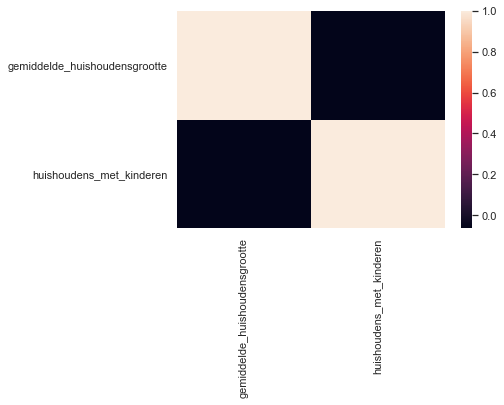

In [281]:
sns.heatmap(dff_buurt_analyse1[Huishouden_feats].corr())

In [282]:
scaler = StandardScaler()
df_scaled= pd.DataFrame(scaler.fit_transform(dff_buurt_analyse1[["gemiddelde_huishoudensgrootte"]]),columns=["gemiddelde_huishoudensgrootte"])

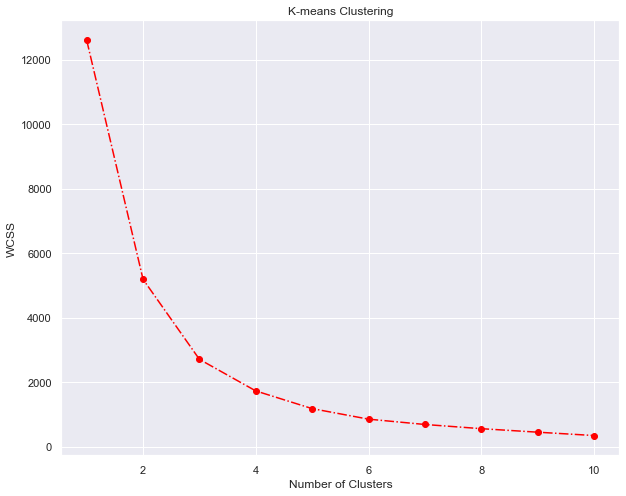

In [283]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans_pca.fit(df_scaled[["gemiddelde_huishoudensgrootte"]])
    wcss.append(kmeans_pca.inertia_)
    
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.show()

In [284]:
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
kmeans.fit(df_scaled[["gemiddelde_huishoudensgrootte"]])

KMeans(n_clusters=3, random_state=42)

In [293]:
dff_buurt_analyse1["Segment_size"] = kmeans.labels_

<AxesSubplot:xlabel='gemiddelde_huishoudensgrootte', ylabel='Count'>

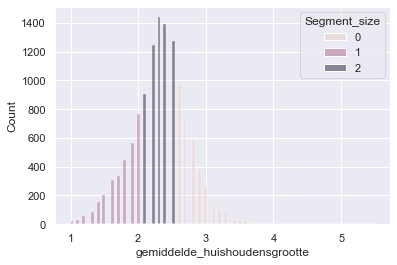

In [294]:
sns.histplot(data = dff_buurt_analyse1[["gemiddelde_huishoudensgrootte"]+["Segment_size"]],x="gemiddelde_huishoudensgrootte",hue="Segment_size")

In [295]:
dff_buurt_2_pers = dff_buurt_analyse1[dff_buurt_analyse1["Segment_size"]==1]

dff_buurt_2_pers.shape

(2974, 80)

In [296]:

elec_aardgas_feats = Elec_vebruikfeats +Aard_vebruikfeats+["stadsverwarming"]

In [297]:
scaler = StandardScaler()
df_scaled= pd.DataFrame(scaler.fit_transform(dff_buurt_2_pers[elec_aardgas_feats]),columns=elec_aardgas_feats)

<AxesSubplot:>

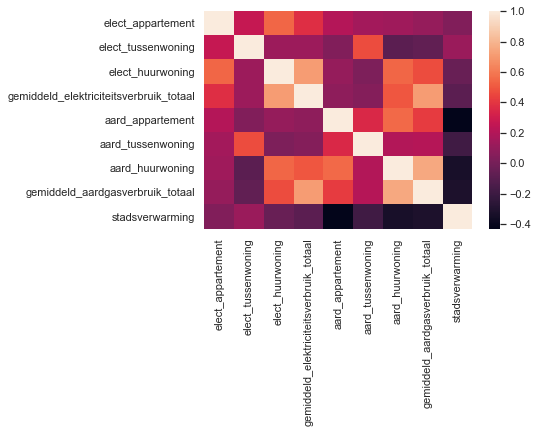

In [298]:
sns.heatmap(df_scaled.corr())

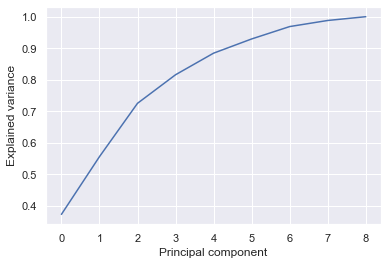

[0.37364246 0.55650012 0.72554738 0.81605684 0.88448309 0.9294998
 0.96873047 0.98803141 1.        ]
6


In [308]:
pca = PCA()
pca.fit(df_scaled) 

sns.lineplot(y = pca.explained_variance_ratio_.cumsum(), x = range(len(pca.explained_variance_ratio_)))
plt.ylabel('Explained variance')
plt.xlabel('Principal component')
plt.show()

print(pca.explained_variance_ratio_.cumsum())
n_components = len([i for i in list(pca.explained_variance_ratio_.cumsum() <0.95) if i ==True])
# print(n_components)

print(n_components)
pca = PCA(n_components = n_components)
principalComponents = pca.fit_transform(StandardScaler().fit_transform(df_scaled))

In [307]:
pca.explained_variance_ratio_.cumsum()

array([0.37364246, 0.55650012, 0.72554738, 0.81605684, 0.88448309,
       0.9294998 ])

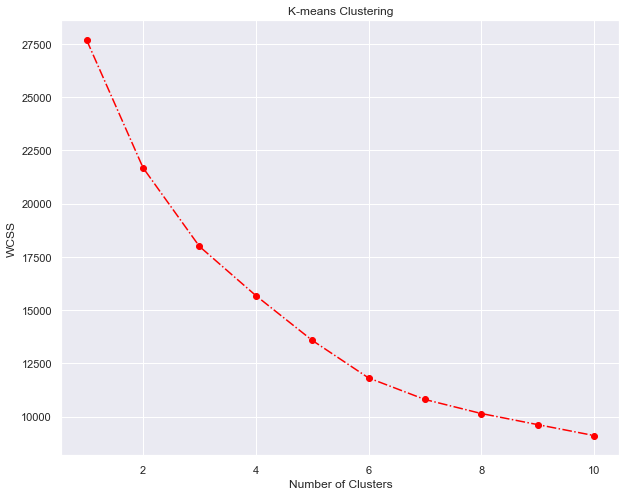

In [94]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans_pca.fit(principalComponents)
    wcss.append(kmeans_pca.inertia_)
    
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.show()

In [309]:
kmeans = KMeans(n_clusters = 6, init = 'k-means++', random_state = 42)
kmeans.fit(principalComponents)

KMeans(n_clusters=6, random_state=42)

In [310]:

# df_ = pd.DataFrame(scaler.inverse_transform(df_scaled[elec_aardgas_feats]),columns = elec_aardgas_feats)

In [311]:
dff_buurt_2_pers.loc[:,"Segment_elec_gas"] = kmeans.labels_

/Users/arnogarstman/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
/Users/arnogarstman/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


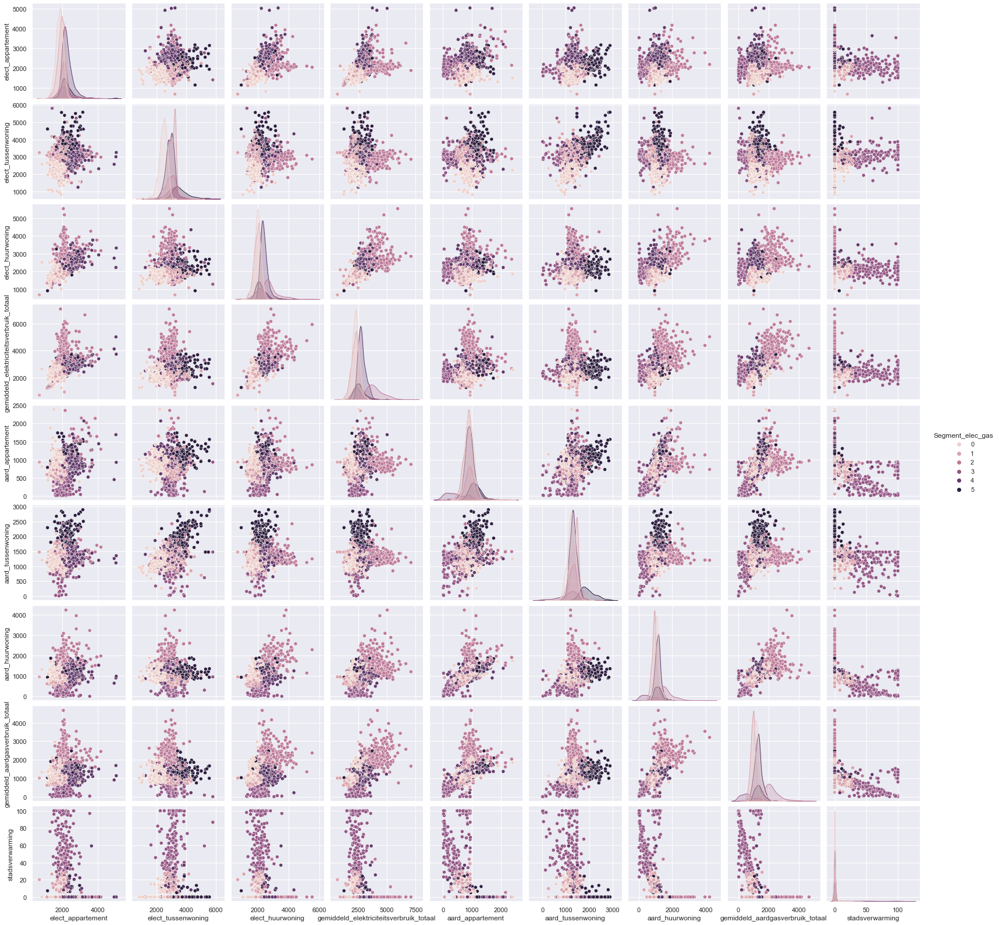

In [313]:
sns.pairplot(dff_buurt_2_pers[elec_aardgas_feats+["Segment_elec_gas"]],hue="Segment_elec_gas")

In [312]:
dff_buurt_2_pers[elec_aardgas_feats+["Segment_elec_gas"]].groupby("Segment_elec_gas").mean().T

Segment_elec_gas,0,1,2,3,4,5
elect_appartement,1822.313293,1918.520580,2174.756550,2080.463146,2275.278757,2206.541908
elect_tussenwoning,2425.906510,3102.986478,2887.458359,3088.187852,2907.256023,3649.117146
elect_huurwoning,1972.322203,1935.008525,2825.746618,2107.953528,2393.062732,2161.487279
gemiddeld_elektriciteitsverbruik_totaal,2289.822251,2227.922964,3937.065322,2380.561068,2824.961456,2592.083333
aard_appartement,908.129114,826.184782,979.832575,426.170694,917.773497,1103.851827
aard_tussenwoning,1232.109923,1350.606562,1345.227601,1112.926094,1314.423156,1944.109469
aard_huurwoning,1084.003566,897.659790,1649.128632,547.727539,1126.489326,1166.185835
gemiddeld_aardgasverbruik_totaal,1217.388901,989.887178,2199.323241,599.268083,1294.470161,1366.188765
stadsverwarming,0.476634,1.803203,0.182335,63.806369,0.679391,0.509722


In [1010]:
# Segment 3 lijkt het meest geschikt voor de elektra-pakketten, hier zijn namelijk een groot gedeelte van de huishoudens (80%) 
# aangesloten op stadsverwarming, wat betekent dat deze groep weinig tot geen gas hoeft te verbruiken voor de CV ketel en dus inpricipe
# alleen elektra nodig heeft.



# Segment 0 lijkt het meest geschikt voor elktra (2500 kwh) en gas (1100 gas). Hier zijn weinig mensen aangesloten op stadsverwarming
# en komen de huurwoningen het meest in de buurt van vebruik in aardgas en elktra vebruik het meest in de buurt van het pakketaanbod.




<AxesSubplot:xlabel='gemeentenaam'>

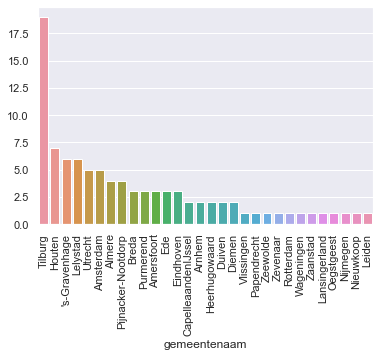

In [101]:
## Duurzaam opgewekte elektra-pakketten - € 880,00 jaarcontract voor 2-persoons huishouden (berekend op 2500 kwh)
plt.xticks(rotation="90")


df_best_elec_only_segment = dff_buurt_2_pers[dff_buurt_2_pers["Segment_elec_gas"] == 1]
counts = df_best_elec_only_segment.value_counts("gemeentenaam")

sns.barplot(x=counts[:30].index, y=counts[:30].values)


<AxesSubplot:xlabel='gemeentenaam'>

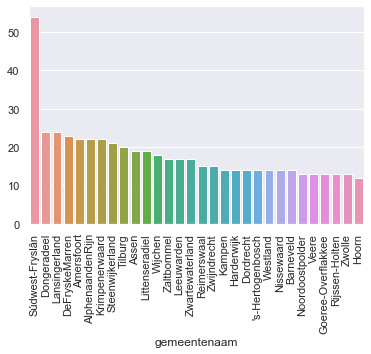

In [102]:
# Groen gas & duurzaam opgewekte elektra-pakketten - € 1402,33 jaarcontract voor 2- persoons huishouden (berekend op 2500 kwh, 1100 m3 gas)


plt.xticks(rotation="90")
df_best_elec_gas_segment = dff_buurt_2_pers[dff_buurt_2_pers["Segment_elec_gas"] == 0]#.groupby("gemeentenaam").count()["codering"].sort_values(ascending=False)
counts = df_best_elec_gas_segment.value_counts("gemeentenaam")

sns.barplot(x=counts[:30].index, y=counts[:30].values)





In [1013]:
# scaler = StandardScaler()
# df_= pd.DataFrame(scaler.fit_transform(df_[["stadsverwarming"]]), columns=["stadsverwarming"])

## Analyse 2



In [315]:
dff_buurt_analyse1 = dff_buurt

In [316]:
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(dff_buurt_analyse1[num_cols]), columns = num_cols)

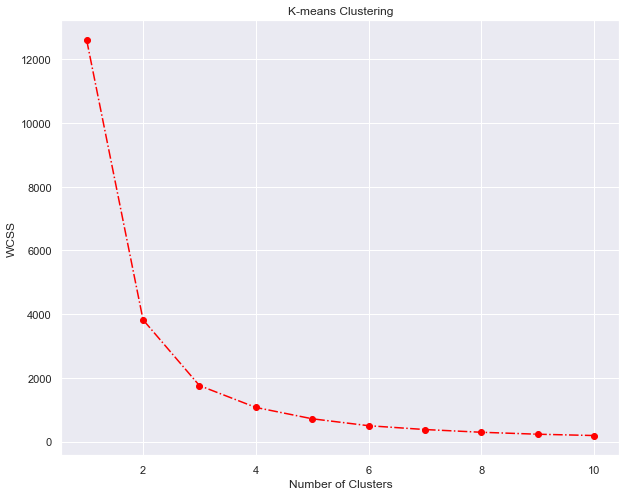

In [317]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans_pca.fit(df_scaled[["koopwoningen"]])
    wcss.append(kmeans_pca.inertia_)
    
    
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.show()

In [318]:
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
kmeans.fit(df_scaled[["koopwoningen"]])

KMeans(n_clusters=3, random_state=42)

In [319]:
dff_buurt["Segment_koopwoningen"] = kmeans.labels_

<AxesSubplot:xlabel='koopwoningen', ylabel='Count'>

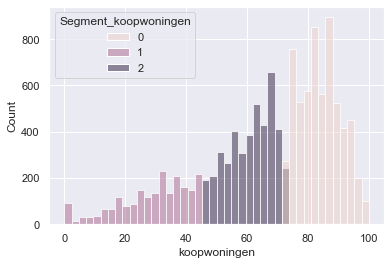

In [320]:
sns.histplot(data = dff_buurt,x="koopwoningen",hue="Segment_koopwoningen")

In [321]:
dff_buurt_koop = dff_buurt_analyse1[dff_buurt_analyse1["Segment_koopwoningen"] ==0]

In [324]:
zonnepanelen = ["aantal_installaties_bij_woningen", "aantal_zonnepanelen_per_installatie", "opgesteld_vermogen_van_zonnepanelen"]

economie = ["gemiddeld_inkomen_per_inkomensontvanger"]

type_woning = ["gemiddelde_woningwaarde","koopwoningen","in_bezit_woningcorporatie"]


# type_woning = ["koopwoningen"]


stedelijkheid = ["mate_van_stedelijkheid"]


feats = zonnepanelen + economie + stedelijkheid

### Analyse 2.1 Zonnepanelen

<AxesSubplot:>

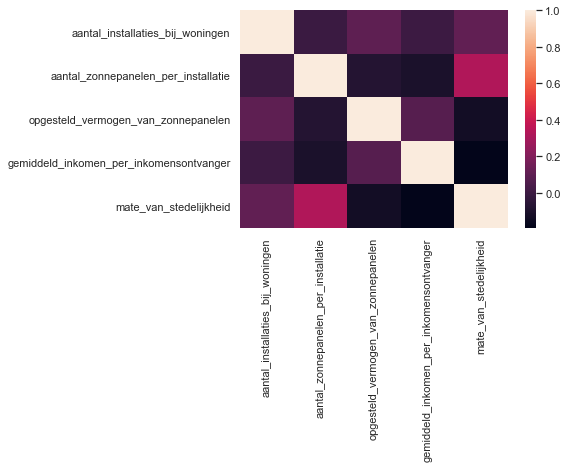

In [325]:
sns.heatmap(dff_buurt_koop[feats].corr())

In [326]:
stedelijkheid = ["mate_van_stedelijkheid"]
feats = zonnepanelen + economie  + stedelijkheid

In [327]:

scaler = StandardScaler()
dff_koop_scaled = pd.DataFrame(scaler.fit_transform(dff_buurt_koop[num_cols]), columns = num_cols)

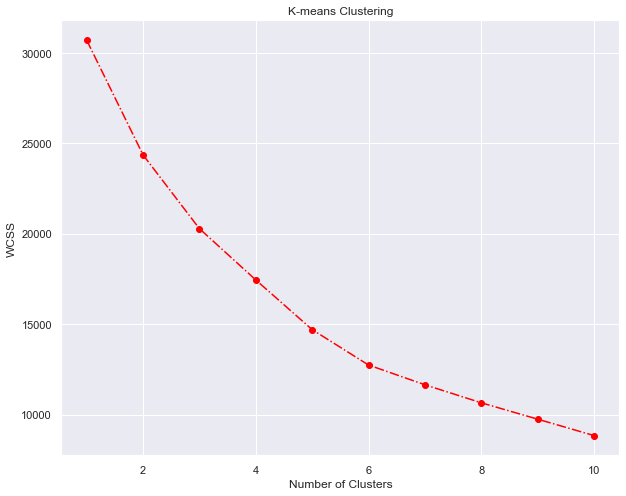

In [328]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans_pca.fit(dff_koop_scaled[feats])
    wcss.append(kmeans_pca.inertia_)
    
    
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.show()

In [329]:
kmeans = KMeans(n_clusters = 6, init = 'k-means++', random_state = 42)
kmeans.fit(dff_koop_scaled[feats])


KMeans(n_clusters=6, random_state=42)

In [330]:
dff_buurt_koop["Segment_zonnepannelen"] = kmeans.labels_

<ipython-input-330-6e6dee482b24>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff_buurt_koop["Segment_zonnepannelen"] = kmeans.labels_


In [331]:
dff_buurt_koop[feats+["Segment_zonnepannelen"]].groupby("Segment_zonnepannelen").mean().T

Segment_zonnepannelen,0,1,2,3,4,5
aantal_installaties_bij_woningen,31.220333,14.799814,697.644244,25.059945,11.841311,25.386337
aantal_zonnepanelen_per_installatie,18.820174,13.834510,19.243170,14.088099,47.875000,15.792138
opgesteld_vermogen_van_zonnepanelen,107.948312,135.347482,199.812171,124.572155,99.046371,523.056492
gemiddeld_inkomen_per_inkomensontvanger,298.726234,306.798955,307.411467,436.917153,304.399971,318.609286
mate_van_stedelijkheid,4.845472,2.319149,4.819444,3.529167,4.919355,4.031792


In [1110]:
#Segment 0: relatief lage stedelijkheid dus veel ruimte voor zonnepannelen. Daarnaast heeft nog maar 44 van de 
#huishoudens. Het aantal zonnepalenelen per installaties ligt ook relatief laag. 



In [336]:
dff_buurt_koop_segm1 = dff_buurt_koop[dff_buurt_koop.Segment_zonnepannelen==1]
counts = dff_buurt_koop_segm1.value_counts("gemeentenaam")

<AxesSubplot:xlabel='gemeentenaam'>

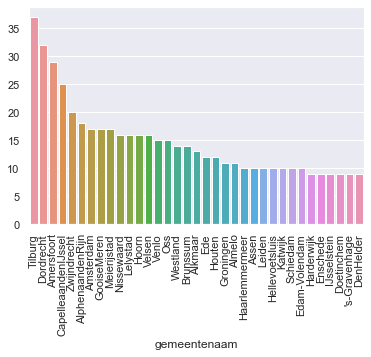

In [337]:
plt.xticks(rotation="90")
sns.barplot(x=counts[:35].index, y=counts[:35].values)



### Analyse 2.2 Laadpalen

In [338]:
economie = ["gemiddeld_inkomen_per_inkomensontvanger"]

laadpalen = ["totaal_aantal_laadpalen"]

type_auto = ["personenautos_overige_brandstof"]

feats = economie + laadpalen + type_auto


In [339]:
# from sklearn.ensemble import IsolationForest


# dff_buurt_koop_nan_dropped 

# sns.histplot(dff_buurt_koop[['totaal_aantal_laadpalen']])
# plt.show()

# # dff_buurt= dff_buurt_koop.dropna(subset=["totaal_aantal_laadpalen"])
# iso = IsolationForest(contamination=0.01)
# iso.fit(dff_buurt[['totaal_aantal_laadpalen']])

# mask = iso.predict(dff_buurt[['totaal_aantal_laadpalen']])
# # select all rows that are not outliers
# outlier_mask = yhat == -1
# mask = yhat == 1


# dff_buurt[outlier_mask, :]

# # = dff_buurt[outlier_mask]
# # sns.histplot(dff_buurt[['totaal_aantal_laadpalen']])

# # plt.show()

In [340]:
scaler = StandardScaler()
dff_koop_scaled = pd.DataFrame(scaler.fit_transform(dff_buurt_koop[num_cols]), columns = num_cols)

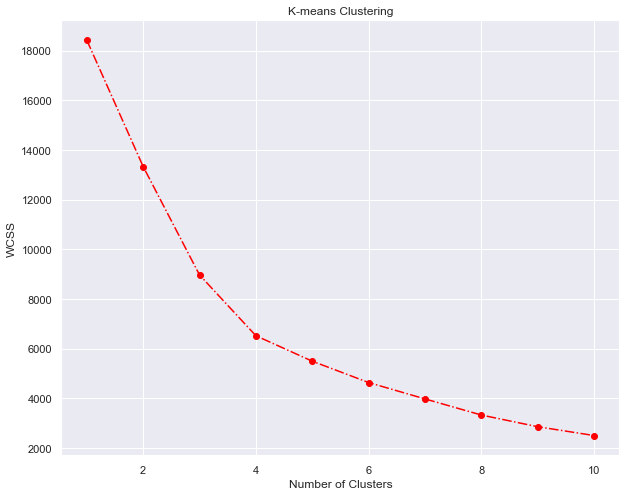

In [341]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans_pca.fit(dff_koop_scaled[feats])
    wcss.append(kmeans_pca.inertia_)
    
    
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.show()

In [342]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
kmeans.fit(dff_koop_scaled[feats])




KMeans(n_clusters=4, random_state=42)

In [343]:
dff_buurt_koop["Segment_laadpalen"] = kmeans.labels_

<ipython-input-343-4ccf438077ec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff_buurt_koop["Segment_laadpalen"] = kmeans.labels_


In [344]:
dff_buurt_koop[feats+["Segment_laadpalen"]].groupby("Segment_laadpalen").mean().T

Segment_laadpalen,0,1,2,3
gemiddeld_inkomen_per_inkomensontvanger,413.409110,299.874526,299.392933,331.000000
totaal_aantal_laadpalen,0.134732,0.239922,0.141683,142.857143
personenautos_overige_brandstof,51.490998,59.760235,25.073734,52.697169


In [345]:
dff_buurt_koop3 = dff_buurt_koop[dff_buurt_koop.Segment_laadpalen.isin([0])]
counts = dff_buurt_koop3.value_counts("gemeentenaam")

<AxesSubplot:xlabel='gemeentenaam'>

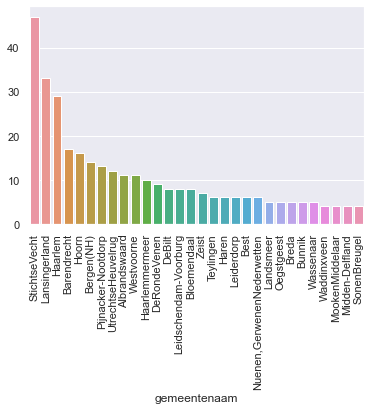

In [346]:
plt.xticks(rotation="90")
sns.barplot(x=counts[:30].index, y=counts[:30].values)

